In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1. BUSINESS UNDERSTANDING

**1.1 Problem Statement**

The client in the context is an insurance company which has provided health insurance to the customers. Now, they need a model which helps predict the likelihood that the customers from the previous year will choose the vehicle insurance offered by the company.

To briefly explain the term insurance, insurance policy is an arrangement in the form of compensation undertaken to guarantee the involvers against specified loss, damage, illness, or death. This is granted in return for the payment of specified premium which is the sum of money paid regularly by the customers for the insurance company

With regard to vehicle insurance, this is the yearly premium of certain amouny paid to the insrance company in return for the compensaton in the case of unfortunate accident by the vehicled

**1.2 Project Objectives**

**1.2.1 Objective**

We aim at building a model which accurately predict the potential customers who would be interested in vehicle insurance provided by the insurance company. With sensible prediction, the company can coordinate the plan accordingly with communication strategy targeting at those customers, whereby increasing the company's revenue

**1.2.2 Benchmark**

1. The metric for the problem is f1 score and recall. A good model must obtain f1 score and recall score greater than 0.6

2. In the case of imbalanced dataset, f1 score would be useful in testing the accuracy of the model

3. In terms of precision and recall, a higher recall is preferable because we should target at the potential customers for the purpose of increasing the sales of vehicle insurance

## 2. DATA UNDERSTANDING

**2.1.1 Data Understanding**

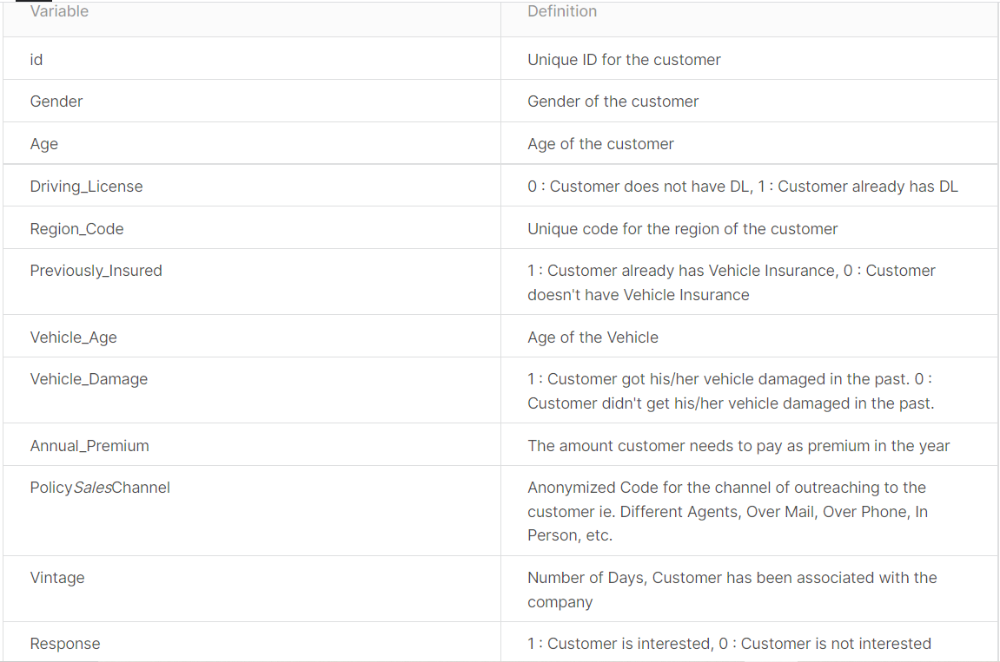

The dataset includes one table, 381109 records as well as 12 fields

**2.2 Exploratory Data Analysis**

To perform the analysis on the dataset, I want to clarify the two objectives I would like to find out:
1. Which factors seem to influence the choice of the customers in choosing the vehicle insurance?
2. Some suggestions which can helps converts the potential customers into the used ones

*a. Library Imported*

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
from plotly.offline import iplot
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, KBinsDiscretizer
from sklearn.model_selection import StratifiedShuffleSplit, StratifiedKFold
from sklearn.metrics import roc_auc_score, f1_score, precision_score, recall_score, roc_curve, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb
import joblib

*b. Load data*

In [3]:
df = pd.read_csv('/content/drive/MyDrive/Health Insurance Cross Sale Prediction/train.csv')

*c. Inspect the data*

In [4]:
df.head(3)

,id,Gender,Age,Driving_License,Region_Code,Previously_Insured,Vehicle_Age,Vehicle_Damage,Annual_Premium,Policy_Sales_Channel,Vintage,Response
0,1,Male,44,1,28.0,0,> 2 Years,Yes,40454.0,26.0,217,1
1,2,Male,76,1,3.0,0,1-2 Year,No,33536.0,26.0,183,0
2,3,Male,47,1,28.0,0,> 2 Years,Yes,38294.0,26.0,27,1


In [5]:
print(df.shape)

(381109, 12)


In [6]:
df.dtypes

id                        int64
Gender                   object
Age                       int64
Driving_License           int64
Region_Code             float64
Previously_Insured        int64
Vehicle_Age              object
Vehicle_Damage           object
Annual_Premium          float64
Policy_Sales_Channel    float64
Vintage                   int64
Response                  int64
dtype: object

* Here, we can note that gender, vehicle age, and vehicle damage are in the string format, which would later be transformed

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 381109 entries, 0 to 381108
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   id                    381109 non-null  int64  
 1   Gender                381109 non-null  object 
 2   Age                   381109 non-null  int64  
 3   Driving_License       381109 non-null  int64  
 4   Region_Code           381109 non-null  float64
 5   Previously_Insured    381109 non-null  int64  
 6   Vehicle_Age           381109 non-null  object 
 7   Vehicle_Damage        381109 non-null  object 
 8   Annual_Premium        381109 non-null  float64
 9   Policy_Sales_Channel  381109 non-null  float64
 10  Vintage               381109 non-null  int64  
 11  Response              381109 non-null  int64  
dtypes: float64(3), int64(6), object(3)
memory usage: 34.9+ MB


* In this dataset, there are no missing values

In [8]:
df.describe()

,id,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Policy_Sales_Channel,Vintage,Response
count,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000,381109.000000
mean,190555.000000,38.822584,0.997869,26.388807,0.458210,30564.389581,112.034295,154.347397,0.122563
std,110016.836208,15.511611,0.046110,13.229888,0.498251,17213.155057,54.203995,83.671304,0.327936
min,1.000000,20.000000,0.000000,0.000000,0.000000,2630.000000,1.000000,10.000000,0.000000
25%,95278.000000,25.000000,1.000000,15.000000,0.000000,24405.000000,29.000000,82.000000,0.000000
50%,190555.000000,36.000000,1.000000,28.000000,0.000000,31669.000000,133.000000,154.000000,0.000000
75%,285832.000000,49.000000,1.000000,35.000000,1.000000,39400.000000,152.000000,227.000000,0.000000
max,381109.000000,85.000000,1.000000,52.000000,1.000000,540165.000000,163.000000,299.000000,1.000000


In [9]:
df['Response'].value_counts()

0    334399
1     46710
Name: Response, dtype: int64

*d. Visualization of the data to answer the questions*

d1. Distribution of the dataset

Text(0.5, 1.0, 'Response Count')

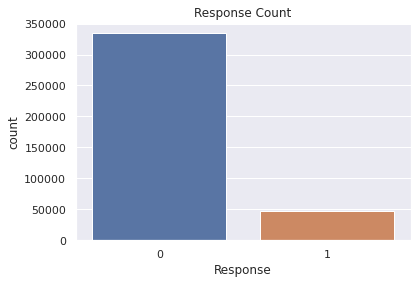

In [10]:
sns.set_theme(style="darkgrid")
sns.countplot(data=df, x='Response')
plt.title('Response Count')

The dataset is heavily **imbalanced** towards the **negative** target field (uninterested responses)

Text(0.5, 1.0, 'Gender Count')

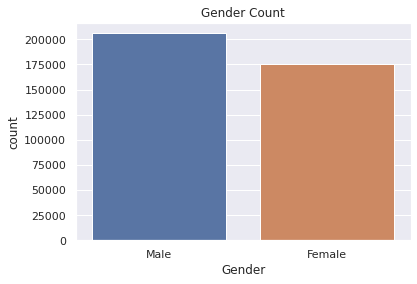

In [11]:
sns.countplot(data=df, x='Gender')
plt.title('Gender Count')

The dataset has a **balanced distribution** of gender

Text(0.5, 1.0, 'Driving License Count')

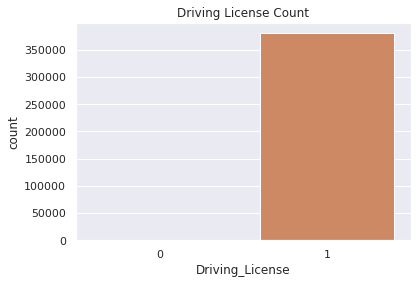

In [12]:
sns.countplot(data=df, x='Driving_License')
plt.title('Driving License Count')

In [13]:
df['Driving_License'].value_counts()

1    380297
0       812
Name: Driving_License, dtype: int64

A great majority of customers have **no driving license**. This is maybe because they are underage. Therefore, they have no driving license.

In [14]:
px.histogram(df[df['Driving_License']==1], x='Age')

Text(0.5, 1.0, 'Vehicle Damage Count')

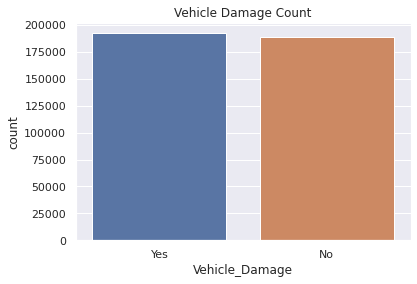

In [15]:
sns.countplot(data=df, x='Vehicle_Damage')
plt.title('Vehicle Damage Count')

Text(0.5, 1.0, 'Vehicle Age Count')

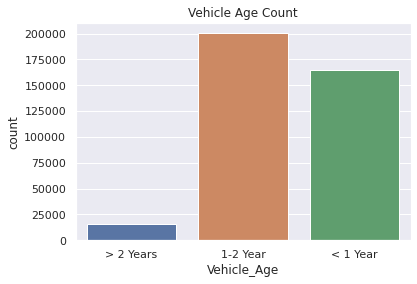

In [16]:
sns.countplot(data=df, x='Vehicle_Age')
plt.title('Vehicle Age Count')

Text(0.5, 1.0, 'Annual premium distribution')

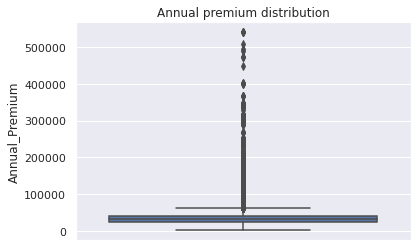

In [17]:
sns.boxplot(data=df, y='Annual_Premium')
plt.title('Annual premium distribution')

The annual premium has outliers and most of the customers pay **less than 100000 ruppee**

Text(0.5, 1.0, 'Vintage distribution')

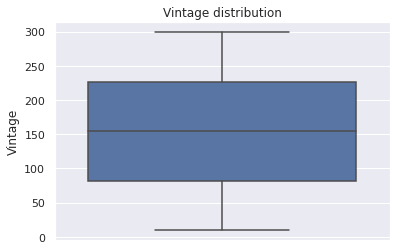

In [18]:
sns.boxplot(data=df, y='Vintage')
plt.title('Vintage distribution')

The feature vintage appears to have no outliers with a **wide range of associated days**

In [19]:
fig = px.histogram(df, x='Age')
fig.update_layout(height=500, width=500,
                  title_text="Age distribution")
fig.show()

The dataset contains mostly the customers at a young age (younger than 35 years old)

In [20]:
fig = px.histogram(df, x='Region_Code')
fig.update_layout(height=500, width=500,
                  title_text="Region_Code distribution")
fig.show()

In [21]:
region_annual_premium = df.groupby('Region_Code')['Annual_Premium'].median().to_frame().reset_index()
fig = px.bar(region_annual_premium, x='Region_Code', y='Annual_Premium')
fig.show()

The greatest number of customers come from region code 8 and 28, which can be explained by the fact that these regions come first in terms of the median/average annual premium

d2. Answer the questions for increasing the conversion rate

*1. Does the previously issued insurance affect the choice for vehicle insurance?*

Text(0.5, 1.0, 'Previously_Insured_count (Not Interested)')

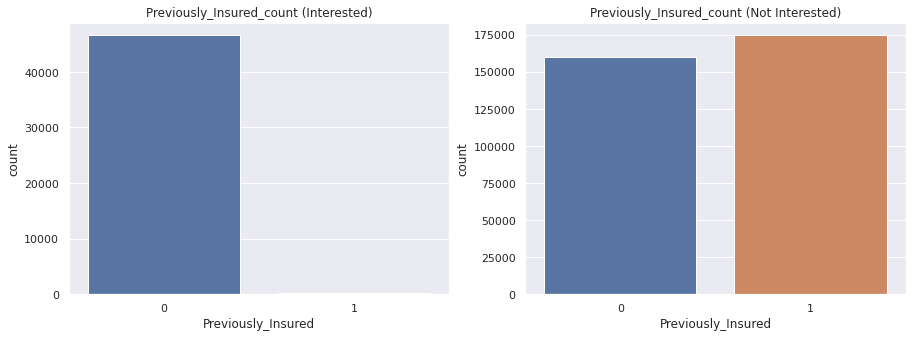

In [22]:
sns.set_theme(style="darkgrid")
sns.color_palette("rocket", as_cmap=True)
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.countplot(data=df[df['Response']==1], x='Previously_Insured', ax=ax[0])
ax[0].set_title('Previously_Insured_count (Interested)')

sns.countplot(data=df[df['Response']==0], x='Previously_Insured', ax=ax[1])
ax[1].set_title('Previously_Insured_count (Not Interested)')

In [23]:
chisqt = pd.crosstab(df.Previously_Insured, df.Response)
value = np.array([chisqt.iloc[0][0:2],
                  chisqt.iloc[1][0:2]])
print(chi2_contingency(value)[0:3])

(44357.96472219977, 0.0, 1)


--> From the visualization and the graph above, it can be seen that the customers who are previously not insured will be the potential ones for providing the vehicle insurance

*2. Does vehicle damage influences the choice of the customers for vehicle insurance*

Text(0.5, 1.0, 'Vehicle Damage Count (Not Interested)')

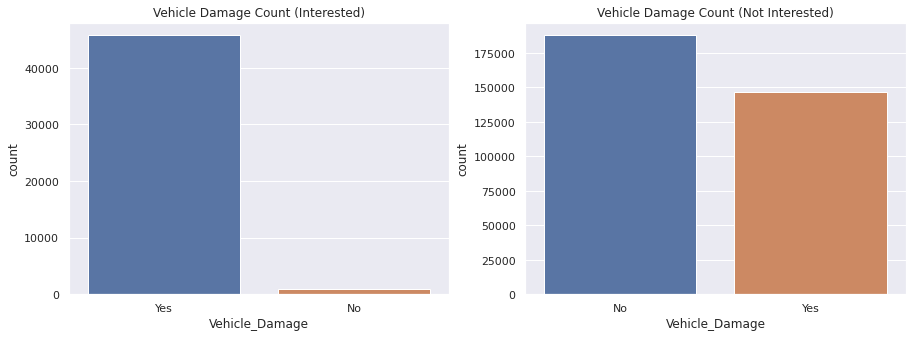

In [24]:
sns.set_theme(style="darkgrid")
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.countplot(data=df[df['Response']==1], x='Vehicle_Damage', ax=ax[0])
ax[0].set_title('Vehicle Damage Count (Interested)')

sns.countplot(data=df[df['Response']==0], x='Vehicle_Damage', ax=ax[1])
ax[1].set_title('Vehicle Damage Count (Not Interested)')

In [25]:
chisqt = pd.crosstab(df.Vehicle_Damage, df.Response)
value = np.array([chisqt.iloc[0][0:2],
                  chisqt.iloc[1][0:2]])
print(chi2_contingency(value)[0:3])

(47864.76180117493, 0.0, 1)


--> From this point of view, that the vehicle underwent damage would influence the customers to choose the vehicle insurance so as to guarantee against the monetary loss

* Sub-question: Who tends to be involved in vehicle damage and at which age?

In [26]:
fig = px.histogram(df, x='Age', color='Vehicle_Damage')
fig.update_layout(height=500, width=800,
                  title_text="Vehicle damage for different ages")

fig.show()

We will also test if gender of the customers really influences the likelihood of vehicle damage

In [27]:
chisqt = pd.crosstab(df.Gender, df.Vehicle_Damage)
value = np.array([chisqt.iloc[0][0:2],
                  chisqt.iloc[1][0:2]])
print(chi2_contingency(value)[0:3])

(3197.763471057695, 0.0, 1)


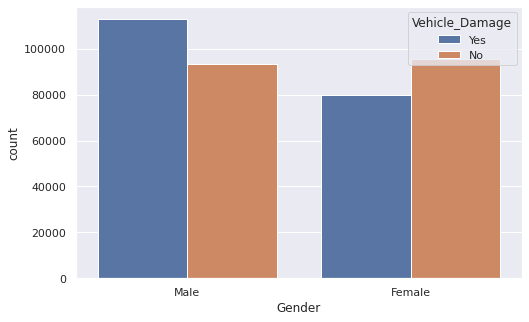

In [28]:
plt.figure(figsize=(8,5))
sns.countplot(x='Gender', hue='Vehicle_Damage', data=df)

As observed by the graph and the statistics:
1. It is true that men are more likely to get involved in the vehicle damage. 
2. People in the middle-age groups or above are more likely to encounter vehicle damage
3. Vehicle damage does influence the choice of the customers in buying vehicle insurance

***3. Does vehicle age affects the decision of the customers for vehicle insurance?***

Text(0.5, 1.0, 'Vehicle Age Count (Not Interested)')

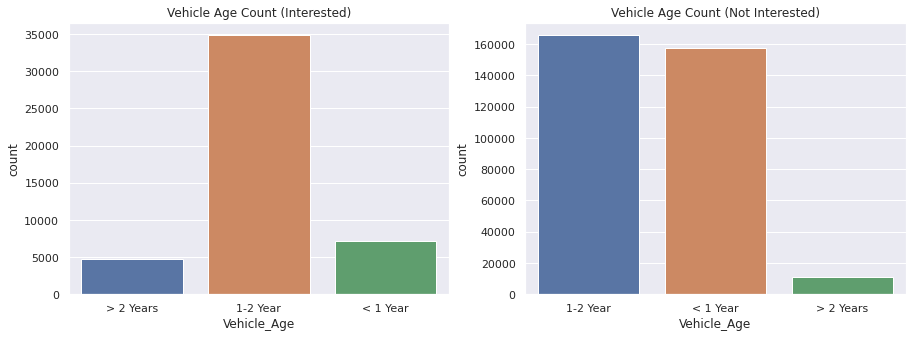

In [29]:
sns.set_theme(style="darkgrid")
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.countplot(data=df[df['Response']==1], x='Vehicle_Age', ax=ax[0])
ax[0].set_title('Vehicle Age Count (Interested)')

sns.countplot(data=df[df['Response']==0], x='Vehicle_Age', ax=ax[1])
ax[1].set_title('Vehicle Age Count (Not Interested)')

In [30]:
chisqt = pd.crosstab(df.Response, df.Vehicle_Age)
value = np.array([chisqt.iloc[0][0:3],
                  chisqt.iloc[1][0:3]])
print(chi2_contingency(value)[0:3])

(18771.889904151052, 0.0, 2)


--> From this chart, it can be observed that vehicle age does affect whether the customers will choose the vehicle insurance or not

* Sub-question: Do age correlate with the vehicle age among the customers?

In [31]:
fig = make_subplots(rows=1, cols=3)

fig.add_trace(
    go.Histogram(x=df[df['Vehicle_Age']=='< 1 Year']['Age'], name='< 1 Year'),
    row=1, col=1)

fig.add_trace(
    go.Histogram(x=df[df['Vehicle_Age']=='1-2 Year']['Age'], name='1-2 Year'),
    row=1, col=2)

fig.add_trace(
    go.Histogram(x=df[df['Vehicle_Age']=='> 2 Years']['Age'], name='> 2 Years'),
    row=1, col=3)

fig.update_layout(height=600, width=800, title_text="Vehicle Age and Customer's age")
fig.show()

It is obvious that the younger age group seem to own the vehicle within a short period of time while the middle-age group seem to own the vehicle for a longer period of time

***4. Does gender plays a role in determining whether the customers will choose the vehicle insurance?***

Text(0.5, 1.0, 'Gender Count (Not Interested)')

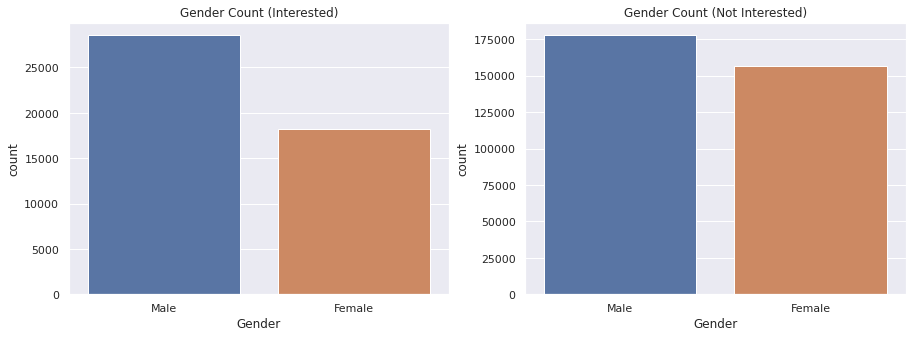

In [32]:
sns.set_theme(style="darkgrid")
fig, ax = plt.subplots(1,2,figsize=(15,5))
sns.countplot(data=df[df['Response']==1], x='Gender', ax=ax[0])
ax[0].set_title('Gender Count (Interested)')

sns.countplot(data=df[df['Response']==0], x='Gender', ax=ax[1])
ax[1].set_title('Gender Count (Not Interested)')

In [33]:
chisqt = pd.crosstab(df.Gender, df.Response)
value = np.array([chisqt.iloc[0][0:2],
                  chisqt.iloc[1][0:2]])
print(chi2_contingency(value)[0:3])

(1047.7077577887574, 7.665800628415621e-230, 1)


--> There is a relationship between gender and the decision whether the customers will choose the vehicle insurance

***5. Does different age groups have different pattern regarding the choice of vehicle insurance?***

In [34]:
df_response_positive = df[df['Response']==1]
df_response_negative = df[df['Response']==0]

In [35]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Histogram(x=df_response_positive['Age'], name='Interested'),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=df_response_negative['Age'], name='Not interested'),
    row=1, col=2
)

fig.update_layout(height=600, width=800, title_text="1 vs 0 Age distribution")
fig.show()

--> The customers who are interested in the insurance policy are generally in the middle age groups

*6. Which channels seem to be the potential ones for increasing the conversion rate with regard to insurance policy?*

In [36]:
fig = make_subplots(rows=1, cols=2)

fig.add_trace(
    go.Histogram(x=df_response_positive['Policy_Sales_Channel'], name='Interested'),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=df_response_negative['Policy_Sales_Channel'], name='Not interested'),
    row=1, col=2
)

fig.update_layout(height=300, width=900, title_text="1 vs 0 in Policy Sales Channel")
fig.show()

Output hidden; open in https://colab.research.google.com to view.

--> Sales channels 26 or 124 would be the optimial ones for increasing the number of customers who buy vehicle insurance

*7. Does the assumption that longer time committing to the insurance company will make the customers buy new insurance policy*

In [37]:
fig = px.histogram(df, x='Vintage', color='Response')
fig.update_layout(height=500, width=800,
                  title_text="Vintage distribution with regard to response")
fig.show()

--> There seems to be no relations betweent the vintage and the number of customers who decides to buy vehicle insurance

*8. Which region codes would be suitable for targeting the campaign for increasing the number of customers buying vehicle insurance?*

In [38]:
fig = make_subplots(rows=2, cols=1)

fig.add_trace(
    go.Histogram(x=df_response_positive['Region_Code'], name='Interested'),
    row=1, col=1
)

fig.add_trace(
    go.Histogram(x=df_response_negative['Region_Code'], name='Not interested'),
    row=2, col=1
)

fig.update_layout(height=400, width=900, title_text="1 vs 0 in Region Code")
fig.show()

* Sub-question: In the region code 28, which sales channel should be focused upon:

In [39]:
iplot([go.Histogram(x=df[df['Region_Code']==28]['Policy_Sales_Channel'], name='Region Code 28')])

***e. Conclusion***

1. Some important information about the dataset


2. The potential force for selling vehicle insurance include:
- The customers who were previously not granted insurance policy and had vehicle damage
- The male customers who are in the middle-aged group
- The customers who have vehicle age ranging from 1 to 2 years
- The customers who come from region code 28

3. Specific suggestions for the insurance company
- The marketing campaign should target primarily at the male customers who are at the middle-age groups and above, previously uninsured and having the vehicle age between 1 and 2 year and coming from the region code 28


## 3. DATA PREPROCESSING

**3.1 DATA PREPROCESSING**

In [40]:
df_copy = df.copy(deep=True)

In [41]:
df_copy.drop(['id','Policy_Sales_Channel'], axis=1, inplace=True)

In [42]:
df_copy = pd.get_dummies(df_copy, columns=['Gender'], drop_first=True)

In [43]:
scaler = MinMaxScaler()
df_copy[['Age', 'Annual_Premium', 'Vintage']] = scaler.fit_transform(df_copy[['Age', 'Annual_Premium', 'Vintage']] )

In [44]:
df_copy['Region_Code'] = df_copy['Region_Code'].apply(lambda x: 1 if x == 28 else 0)

In [45]:
df_copy = pd.get_dummies(df_copy, columns=['Vehicle_Age'], drop_first=True)

In [46]:
df_copy = df_copy.rename(columns={"Vehicle_Age_< 1 Year": "Vehicle_Age less than 1 Year",
                        "Vehicle_Age_> 2 Years": "Vehicle_Age over 2 Years"})

In [47]:
df_copy = pd.get_dummies(df_copy, columns=['Vehicle_Damage'], drop_first=True)

In [48]:
df_copy.head(3)

,Age,Driving_License,Region_Code,Previously_Insured,Annual_Premium,Vintage,Response,Gender_Male,Vehicle_Age less than 1 Year,Vehicle_Age over 2 Years,Vehicle_Damage_Yes
0,0.369231,1,1,0,0.070366,0.716263,1,1,0,1,1
1,0.861538,1,0,0,0.057496,0.598616,0,1,0,0,0
2,0.415385,1,1,0,0.066347,0.058824,1,1,0,1,1


**3.2 FEATURE SELECTION**

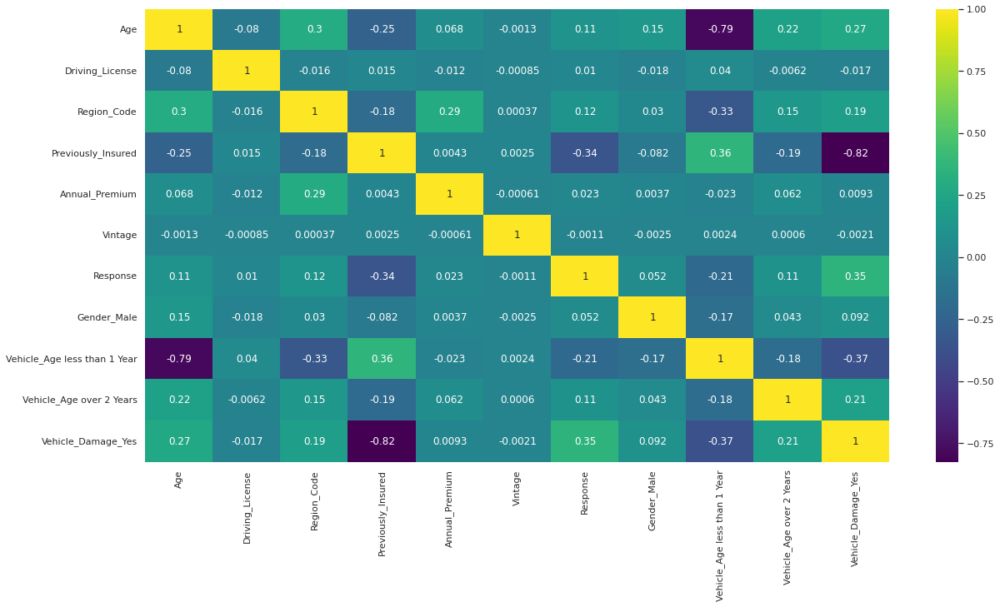

In [49]:
plt.figure(figsize=(20,10))
sns.heatmap(df_copy.corr(), annot=True, cmap = 'viridis')

Since the correlation coefficient of the driving license is small. Besides, the majority of the customers do have driving license, we can drop this feature.

Annual premium and vintage also have low coefficient values. Therefore we will also drop these features.

In [50]:
df_copy.drop(['Driving_License'],axis=1, inplace=True)

**3.3 TRAIN TEST SPLIT**

In [51]:
fold = StratifiedKFold(n_splits = 5, shuffle =True, )
for train_index, test_index in fold.split(df_copy.drop('Response', axis=1), df_copy['Response']):
  train_data = df_copy.loc[train_index]
  test_data = df_copy.loc[test_index]

In [52]:
train_data['Response'].value_counts()

0    267520
1     37368
Name: Response, dtype: int64

In [53]:
test_data['Response'].value_counts()

0    66879
1     9342
Name: Response, dtype: int64

In [54]:
X_train, y_train = train_data.drop('Response', axis=1), train_data['Response']
X_test, y_test = test_data.drop('Response', axis=1), test_data['Response']

## 4. BUILD THE MODEL

**4.1 CREATING THE MODEL**

In [55]:
def trainingModel(model, X_train, y_train):
  model.fit(X_train, y_train)
  print("The model has been trained")
  return model

In [56]:
def testingModel(model, algo, score, X_test, y_test):
  print('Testing the model')
  y_prediction = model.predict(X_test)
  y_prediction = y_prediction.astype('int')

  # Evalutation metric
  f1_recorded = f1_score(y_test, y_prediction)
  precision_recorded = precision_score(y_test, y_prediction)
  recall_recorded = recall_score(y_test, y_prediction)

  # Classification report
  print("The classification report:")
  print("F1 score: ", f1_recorded)
  print("Recall: ", recall_recorded)
  print("Precision: ", precision_recorded)

  # Score dictionary
  score['f1_score'] = f1_recorded
  score['recall_score'] = recall_recorded
  score['precision_score'] = precision_recorded

  # Plot the confusion matrix
  cm = confusion_matrix(y_test, y_prediction)
  sns.heatmap(cm, robust=True,
              vmin=cm.min(), vmax=cm.max(), annot=True,
              cmap='viridis')
  plt.xlabel('Predicted output')
  plt.ylabel('True output')
  plt.show()
  
  return score

In [57]:
def training_testing_baseline_model(algo='LR', train_data=(X_train, y_train), test_data = (X_test, y_test)):
  score = {}
  (X_train, y_train) = train_data
  (X_test, y_test) = test_data
  if algo == 'LR':
    score['Model'] = 'Logistic Regression'
    print('Model for Logistic Regression')
    model = LogisticRegression(class_weight='balanced')
    param_grid = {'C':np.linspace(0.01,0.5,10),
                  'solver':['newton-cg', 'lbfgs', 'liblinear'],
                  'max_iter':[150,200,250]}
    rds = RandomizedSearchCV(estimator=model,
                             param_distributions=param_grid,
                             n_iter=10,
                             cv=5,
                             n_jobs=-1,
                             verbose=1,
                             random_state=42)
    
    rds.fit(X_train, y_train)
    print('The best parameters are: ', rds.best_params_)

    best_model = LogisticRegression(**rds.best_params_, class_weight='balanced')
    model = trainingModel(best_model, X_train, y_train)

    score = testingModel(model, algo, score, X_test, y_test)
    return model, score

**4.2 APPLY OTHER ADVANCED MODEL**

https://www.analyticsvidhya.com/blog/2020/09/alternative-hyperparameter-optimization-technique-you-need-to-know-hyperopt/

In [58]:
from sklearn import metrics
# Scale pos weight 4 is for oversampling method
# 
def train_model_ensemble_method(algo, train_data=(X_train, y_train), test_data = (X_test, y_test)):
  score = {}
  (X_train, y_train) = train_data
  (X_test, y_test) = test_data
  if algo == 'XGB' or algo == 'XGB_USample' or algo == 'XGB_OSample':
    scale_pos = y_train.value_counts()[0] / y_train.value_counts()[1]
    score['Model'] = algo
    space = { 'max_depth': hp.quniform("max_depth", 4,14,1),
        'gamma': hp.uniform ('gamma', 1,9),
        'reg_lambda' : hp.uniform('reg_lambda', 0,1),
        'learning_rate' : hp.loguniform("learning_rate",-2,-1),
        'colsample_bytree' : hp.uniform('colsample_bytree', 0.5,1),
        'min_child_weight' : hp.quniform('min_child_weight', 0, 12, 1),
        'n_estimators': 500,
        'seed': 9}
    print('XGBoost model created')
        
    # Parameters tuning
        
    # An optimization function
    def objective(space):
      clf=xgb.XGBClassifier(
          n_estimators = space['n_estimators'], max_depth = int(space['max_depth']), 
          gamma = space['gamma'], learning_rate = space['learning_rate'],
          reg_lambda = int(space['reg_lambda']),
          min_child_weight= int(space['min_child_weight']),
          colsample_bytree= int(space['colsample_bytree']),
          use_label_encoder=False,
          scale_pos_weight=scale_pos)
      
      evaluation = [(X_train, y_train), (X_test, y_test)]

      clf.fit(X_train, y_train,
              eval_set=evaluation, eval_metric="error",
              early_stopping_rounds=10,verbose=False)

      y_score = clf.predict(X_test)
      f1 = f1_score(y_test, y_score)
      return {'loss': -f1, 'status': STATUS_OK }
        
    # loggin
    trials = Trials()
    print('Searching params for XGB...')
        
    # tuning function
    best_params = fmin(fn = objective,
                       space = space,
                       algo = tpe.suggest,
                       max_evals = 100,
                       trials = trials,
                       rstate=np.random.RandomState(42))
        
    best_params['max_depth'] = int(best_params['max_depth'])
    print('Best params are:', best_params)
    model = xgb.XGBClassifier(**best_params, n_estimators=500, use_label_encoder=False, scale_pos_weight=scale_pos)

  if algo == 'RF' or algo == 'RF_USample' or algo == 'RF_OSample':
    score['Model'] = algo
    print("Random Forest Model created")
    times_over = y_train.value_counts()[0] / y_train.value_counts()[1]
    weight_dict = {0: (1/(times_over+1)), 1: (1-((1/(times_over+1))))}
    model = RandomForestClassifier(class_weight=weight_dict)

    param_grid = {'criterion':['entropy', 'gini'],
                  'max_depth':[3,5,7,8,9,10],
                  'min_samples_leaf':[5,6,7,8],
                  'min_samples_split':[6,7,8,10],
                  'n_estimators':[100,200,300]}
    rf_search = RandomizedSearchCV(estimator=model,
                                   param_distributions=param_grid,
                                   n_iter=10, cv=3,
                                   n_jobs=-1,
                                   verbose=1,
                                   random_state=42, scoring='f1_weighted')
    print('Searching params for RF...')
    rf_search.fit(X_train, y_train)

    print('Best parameters for random forest')
    best_params = rf_search.best_params_
    model = RandomForestClassifier(**best_params, class_weight=weight_dict)

  
  if algo == 'LGBM' or algo == 'LGBM_USample' or algo == 'LGBM_OSample':
    score['Model'] = algo
    times_over = y_train.value_counts()[0] / y_train.value_counts()[1]
    weight_ = {0: (1/(times_over+1)), 1: (1-((1/(times_over+1))))}

    space = {'max_depth': hp.quniform('max_depth', 4, 14, 1),
             'learning_rate': hp.loguniform('learning_rate', -2, -1),
             'reg_lambda': hp.uniform('reg_lambda', 2.0, 3.0),
             'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1),
             'min_child_weight': hp.quniform('min_child_weight', 5, 10, 1),
             'reg_alpha': hp.uniform('reg_alpha', 2.0, 3.0)}

    def lgbm_objective(space):

      lgbm_classifier = lgb.LGBMClassifier(random_state=42,
                                           n_estimators=500,
                                           max_depth=int(space['max_depth']),
                                           learning_rate=space['learning_rate'],
                                           reg_lambda=space['reg_lambda'],
                                           reg_alpha=space['reg_alpha'],
                                           min_child_weight=space['min_child_weight'],
                                           colsample_bytree=space['colsample_bytree'],
                                           objective='binary',
                                           metrics='binary_logloss',
                                           boosting_type='gbdt',
                                           class_weight=weight_)
      evaluation = [(X_train, y_train), (X_test, y_test)]

      lgbm_classifier.fit(X_train, y_train,
                          eval_set=evaluation,
                          eval_metric='error',
                          early_stopping_rounds=10,
                          verbose=False)
      

      y_score = lgbm_classifier.predict(X_test)
      f1 = f1_score(y_test, y_score)
      return {'loss': -f1, 'status': STATUS_OK }

    trials = Trials()
    print('Searching parameters for LGBM...')
    best_params = fmin(fn=lgbm_objective,
                       space=space,
                       algo=tpe.suggest,
                       max_evals=100,
                       trials=trials,
                       rstate= np.random.RandomState(42))
    
    print('Best params are: ', best_params)
    best_params['max_depth'] = int(best_params['max_depth'])

    

    model = lgb.LGBMClassifier(random_state=42, **best_params, n_estimators=500,
                               objective='binary', metrics='binary_logloss', boosting_type='gbdt', class_weight=weight_)

    

  model = trainingModel(model, X_train, y_train)

  score = testingModel(model, algo, score, X_test, y_test)
  return model, score

**4.3 TESTING AND EVALUATION**

In [ ]:
y_test.value_counts()

0    66879
1     9342
Name: Response, dtype: int64

Model for Logistic Regression
Fitting 5 folds for each of 10 candidates, totalling 50 fits
The best parameters are:  {'solver': 'liblinear', 'max_iter': 150, 'C': 0.3911111111111111}
The model has been trained
Testing the model
The classification report:
F1 score:  0.3973512837941544
Recall:  0.969920787839863
Precision:  0.24985523231766166


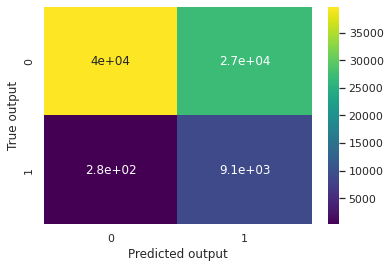

In [ ]:
model_lr, score_lr = training_testing_baseline_model(algo='LR')

XGBoost model created
Searching params for XGB...
100%|██████████| 100/100 [14:43<00:00,  8.83s/it, best loss: -0.433144616347935]
Best params are: {'colsample_bytree': 0.9935502135063627, 'gamma': 5.345823593853895, 'learning_rate': 0.2616403401353488, 'max_depth': 13, 'min_child_weight': 3.0, 'reg_lambda': 0.7698260113156157}
The model has been trained
Testing the model
The classification report:
F1 score:  0.4266635630946492
Recall:  0.7848426461143224
Precision:  0.29296359931274224


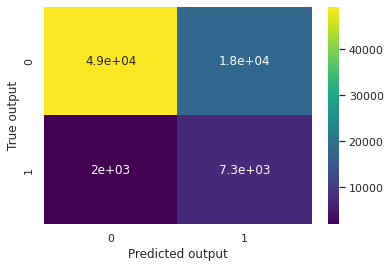

In [ ]:
model_xgb, score_xgb = train_model_ensemble_method(algo='XGB')

Random Forest Model created
Searching params for RF...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters for random forest
The model has been trained
Testing the model
The classification report:
F1 score:  0.4269818163874565
Recall:  0.9262470563048598
Precision:  0.27743755811343745


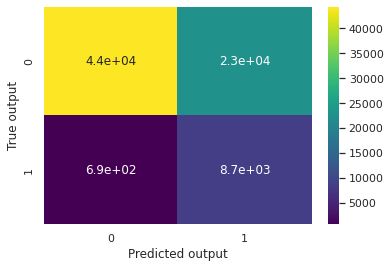

In [ ]:
model_rdf, score_rdf = train_model_ensemble_method(algo='RF')

Searching parameters for LGBM...
100%|██████████| 100/100 [03:32<00:00,  2.13s/it, best loss: -0.4327129563350036]
Best params are:  {'colsample_bytree': 0.8762782069660855, 'learning_rate': 0.19001405043220188, 'max_depth': 14.0, 'min_child_weight': 6.0, 'reg_alpha': 2.2295038952355855, 'reg_lambda': 2.3666646136100944}
The model has been trained
Testing the model
The classification report:
F1 score:  0.4278456055205885
Recall:  0.9059087989723827
Precision:  0.28005559416261294


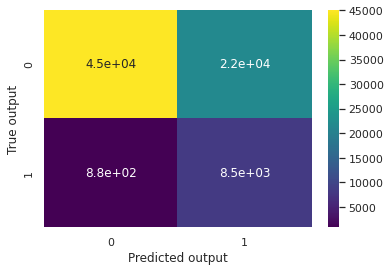

In [ ]:
model_lbgm, score_lgbm = train_model_ensemble_method(algo='LGBM')

#5. IMPROVEMENT TO THE MODEL

**5.1 APPLY OVERSAMPLING/DOWNSAMPLING TECHNIQUES**

In [ ]:
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
# from imblearn.over_sampling import SMOTE

In [ ]:
# sm = SMOTE()

In [ ]:
# X_train_over_sample, y_train_over_sample = sm.fit_resample(X_train, y_train)

In [ ]:
oversampler = RandomOverSampler(random_state=42, sampling_strategy=0.4)
undersampler = RandomUnderSampler(random_state=42, sampling_strategy=0.65)

In [ ]:
X_train_over_sample, y_train_over_sample = oversampler.fit_resample(X_train, y_train)
X_train_under_sample, y_train_under_sample = undersampler.fit_resample(X_train, y_train)

In [ ]:
y_train_over_sample.value_counts()

0    267520
1    107008
Name: Response, dtype: int64

In [ ]:
y_train_under_sample.value_counts()

0    57489
1    37368
Name: Response, dtype: int64

5.3 APPLY THE SAMPLING METHOD 

Random Forest Model created
Searching params for RF...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters for random forest
The model has been trained
Testing the model
The classification report:
F1 score:  0.4261328748618446
Recall:  0.9286020124170413
Precision:  0.27651165014502915


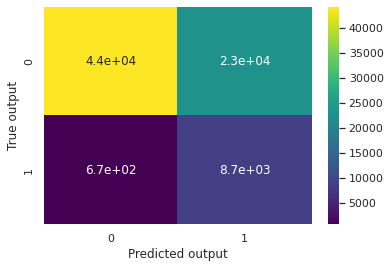

In [ ]:
model_rdf_over_sample, score_rdf_over_sample = train_model_ensemble_method(algo='RF_OSample', train_data=(X_train_over_sample, y_train_over_sample), test_data = (X_test, y_test))

Random Forest Model created
Searching params for RF...
Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best parameters for random forest
The model has been trained
Testing the model
The classification report:
F1 score:  0.424730003169263
Recall:  0.9324555769642475
Precision:  0.2749944754869464


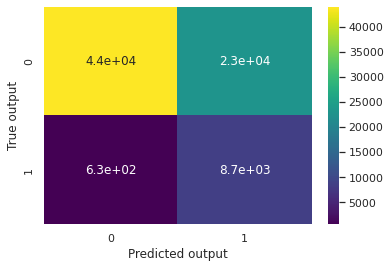

In [ ]:
model_rdf_under_sample, score_rdf_under_sample = train_model_ensemble_method(algo='RF_USample', train_data=(X_train_under_sample, y_train_under_sample), test_data = (X_test, y_test))

XGBoost model created
Searching params for XGB...
100%|██████████| 100/100 [19:46<00:00, 11.86s/it, best loss: -0.4337714599284015]
Best params are: {'colsample_bytree': 0.7548700654547549, 'gamma': 2.864565853084555, 'learning_rate': 0.17954370443475537, 'max_depth': 12, 'min_child_weight': 5.0, 'reg_lambda': 0.6913835185866757}
The model has been trained
Testing the model
The classification report:
F1 score:  0.4285430219015425
Recall:  0.8074288160993364
Precision:  0.29167472255519894


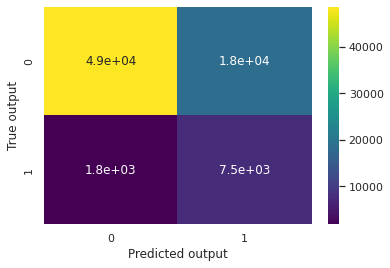

In [ ]:
model_xgb_over_sample, score_xgb_over_sample = train_model_ensemble_method(algo='XGB_OSample', train_data=(X_train_over_sample, y_train_over_sample), test_data = (X_test, y_test))

XGBoost model created
Searching params for XGB...
100%|██████████| 100/100 [05:11<00:00,  3.11s/it, best loss: -0.4327250956607751]
Best params are: {'colsample_bytree': 0.8009170648698403, 'gamma': 1.7047289134745416, 'learning_rate': 0.2501690788851511, 'max_depth': 8, 'min_child_weight': 11.0, 'reg_lambda': 0.22623048126142453}
The model has been trained
Testing the model
The classification report:
F1 score:  0.42569193742478945
Recall:  0.9087989723827874
Precision:  0.27794146533097625


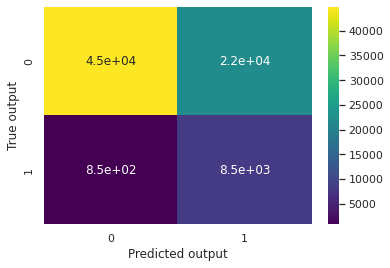

In [ ]:
model_xgb_under_sample, score_xgb_under_sample = train_model_ensemble_method(algo='XGB_USample', train_data=(X_train_under_sample, y_train_under_sample), test_data = (X_test, y_test))

Searching parameters for LGBM...
100%|██████████| 100/100 [04:39<00:00,  2.79s/it, best loss: -0.43272077590607455]
Best params are:  {'colsample_bytree': 0.8192896625796017, 'learning_rate': 0.20904472697625245, 'max_depth': 14.0, 'min_child_weight': 10.0, 'reg_alpha': 2.434888860715641, 'reg_lambda': 2.29233618959461}
The model has been trained
Testing the model
The classification report:
F1 score:  0.43001264287741575
Recall:  0.8919931492185827
Precision:  0.2832908380078191


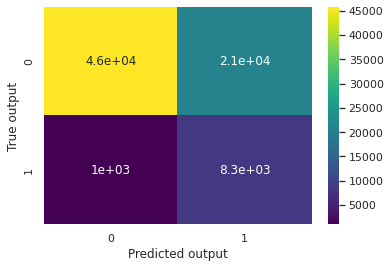

In [ ]:
model_lgbm_over_sample, score_lgbm_over_sample = train_model_ensemble_method(algo='LGBM_OSample', train_data=(X_train_over_sample, y_train_over_sample), test_data = (X_test, y_test))

Searching parameters for LGBM...
100%|██████████| 100/100 [01:16<00:00,  1.30it/s, best loss: -0.43250807867484287]
Best params are:  {'colsample_bytree': 0.8076417594800291, 'learning_rate': 0.32832312278596404, 'max_depth': 9.0, 'min_child_weight': 10.0, 'reg_alpha': 2.9985364717541754, 'reg_lambda': 2.703928816440026}
The model has been trained
Testing the model
The classification report:
F1 score:  0.4262988872015734
Recall:  0.9165061014771998
Precision:  0.2777435365102021


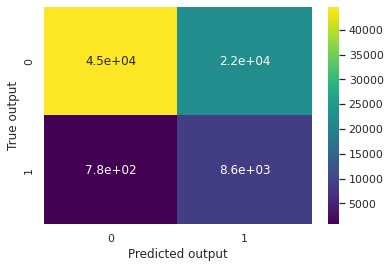

In [ ]:
model_lgbm_under_sample, score_lgbm_under_sample = train_model_ensemble_method(algo='LGBM_USample', train_data=(X_train_under_sample, y_train_under_sample), test_data = (X_test, y_test))

6. TABLE OF EVALUATION AND CONCLUSION

Now I will create a table of the score obtained from different sample techniques

In [ ]:
score_df = pd.DataFrame(columns=['Model','f1_score','precision_score', 'recall_score'])
score_list = [score_lr, score_xgb, score_rdf, score_lgbm, score_rdf_over_sample, score_rdf_under_sample, score_xgb_over_sample, score_xgb_under_sample, score_lgbm_over_sample, score_lgbm_under_sample]
for score in score_list:
  score_df = score_df.append(score, ignore_index=True)

In [ ]:
score_df.to_csv('ScoringDataframe_final.csv', index=False)

In [ ]:
score_dataframe = pd.read_csv('/content/drive/MyDrive/Health Insurance Cross Sale Prediction/ScoringDataframe_final.csv')
score_dataframe

,Model,f1_score,precision_score,recall_score
0,Logistic Regression,0.397351,0.249855,0.969921
1,XGB,0.426664,0.292964,0.784843
2,RF,0.426982,0.277438,0.926247
3,LGBM,0.427846,0.280056,0.905909
4,RF_OSample,0.426133,0.276512,0.928602
5,RF_USample,0.424730,0.274994,0.932456
6,XGB_OSample,0.428543,0.291675,0.807429
7,XGB_USample,0.425692,0.277941,0.908799
8,LGBM_OSample,0.430013,0.283291,0.891993
9,LGBM_USample,0.426299,0.277744,0.916506


The oversampling technique performs better than the undersampling one

## CONCLUSION

The model chosen would be LGBM with oversampling method. The best parameter is as followed

'colsample_bytree': 0.8192896625796017, 'learning_rate': 0.20904472697625245, 'max_depth': 14.0, 'min_child_weight': 10.0, 'reg_alpha': 2.434888860715641, 'reg_lambda': 2.29233618959461

In [ ]:
times_over = y_train_over_sample.value_counts()[0] / y_train_over_sample.value_counts()[1]
weight_ = {0: (1/(times_over+1)), 1: (1-((1/(times_over+1))))}

In [ ]:
final_model = lgb.LGBMClassifier(colsample_bytree = 0.8192896625796017, learning_rate = 0.20904472697625245, max_depth  = 14, min_child_weight = 10, reg_lambda = 2.29233618959461, n_estimators=500, reg_alpha=2.434888860715641,
                                 objective='binary', metrics='binary_logloss', boosting_type='gbdt', class_weight=weight_, random_state=42)
         

In [ ]:
final_model.fit(X_train_over_sample, y_train_over_sample)

LGBMClassifier(class_weight={0: 0.2857142857142857, 1: 0.7142857142857143},
               colsample_bytree=0.8192896625796017,
               learning_rate=0.20904472697625245, max_depth=14,
               metrics='binary_logloss', min_child_weight=10, n_estimators=500,
               objective='binary', random_state=42, reg_alpha=2.434888860715641,
               reg_lambda=2.29233618959461)

In [ ]:
joblib.dump(final_model, 'final_model.pkl')

['final_model.pkl']

In [ ]:
model_from_joblib = joblib.load('/content/drive/MyDrive/Health Insurance Cross Sale Prediction/final_model.pkl')

In [ ]:
prediction = model_from_joblib.predict(X_test)
f1_score(y_test, prediction)

0.43001264287741575

## BUILD NEURAL NETWORK MODEL

In [ ]:
pip install tensorflow_addons

     |████████████████████████████████| 1.1 MB 17.7 MB/s 


In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Input, BatchNormalization, Dropout
import keras
import tensorflow_addons as tfa

In [ ]:
X_train.shape

(304888, 9)

In [ ]:
def create_model():
  threshold = 0.1
  model = tf.keras.Sequential([
                               Input(9),
                               BatchNormalization(),
                               Dense(30, activation='relu'),
                               BatchNormalization(),
                               Dropout(0.3),
                               Dense(30, activation='relu'),
                               Dense(2, activation='softmax')   
  ])

  model.compile(loss=tf.keras.losses.binary_crossentropy,
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
                metrics = [tfa.metrics.FBetaScore(num_classes=2, average="weighted", threshold = threshold)])
  return model

In [ ]:
# y_nn_train = tf.keras.utils.to_categorical(y_train)

In [ ]:
y_nn_train_over = tf.keras.utils.to_categorical(y_train_over_sample)
times_over = y_train_over_sample.value_counts()[0] / y_train_over_sample.value_counts()[1]
weight_dict = {0: (1/(times_over+1)), 1: (1-((1/(times_over+1))))}

In [ ]:
# times_over = y_train.value_counts()[0] / y_train.value_counts()[1]
# weight_dict = {0: (1/(times_over+1)), 1: (1-((1/(times_over+1))))}

In [ ]:
model = create_model()
model.fit(X_train_over_sample, y_nn_train_over, validation_split=0.2, epochs=35,
          batch_size=256, verbose=2, class_weight=weight_dict)

Epoch 1/35
1171/1171 - 4s - loss: 0.1401 - fbeta_score: 0.8681 - val_loss: 0.7673 - val_fbeta_score: 0.9086 - 4s/epoch - 3ms/step
Epoch 2/35
1171/1171 - 3s - loss: 0.1325 - fbeta_score: 0.8710 - val_loss: 0.7497 - val_fbeta_score: 0.9081 - 3s/epoch - 2ms/step
Epoch 3/35
1171/1171 - 3s - loss: 0.1320 - fbeta_score: 0.8714 - val_loss: 0.7371 - val_fbeta_score: 0.9062 - 3s/epoch - 3ms/step
Epoch 4/35
1171/1171 - 3s - loss: 0.1317 - fbeta_score: 0.8714 - val_loss: 0.7722 - val_fbeta_score: 0.9060 - 3s/epoch - 3ms/step
Epoch 5/35
1171/1171 - 3s - loss: 0.1316 - fbeta_score: 0.8714 - val_loss: 0.7284 - val_fbeta_score: 0.9022 - 3s/epoch - 3ms/step
Epoch 6/35
1171/1171 - 3s - loss: 0.1314 - fbeta_score: 0.8715 - val_loss: 0.7551 - val_fbeta_score: 0.9023 - 3s/epoch - 2ms/step
Epoch 7/35
1171/1171 - 3s - loss: 0.1312 - fbeta_score: 0.8716 - val_loss: 0.7469 - val_fbeta_score: 0.9092 - 3s/epoch - 2ms/step
Epoch 8/35
1171/1171 - 3s - loss: 0.1313 - fbeta_score: 0.8716 - val_loss: 0.7425 - val_fb

In [ ]:
# model_new = create_model()
# y_nn_train_oversample = tf.keras.utils.to_categorical(y_train_over_sample)

# model_new.fit(X_train_over_sample, y_nn_train, validation_split=0.2, epochs=35,
#           batch_size=256, verbose=2, class_weight=weight_dict)

In [ ]:
y_test_nn = tf.keras.utils.to_categorical(y_test)

In [ ]:
model.evaluate(X_test, y_test_nn)

2382/2382 [==============================] - 3s 1ms/step - loss: 0.3111 - fbeta_score: 0.8723


[0.3111099302768707, 0.8723189830780029]

In [ ]:
preds = model.predict(X_test)
preds = np.argmax(preds, axis=1)

In [ ]:
f1_score(np.array(y_test.tolist()), preds)

0.43066406250000006

In [ ]:
recall_score(np.array(y_test.tolist()), preds)

0.6378719760222651

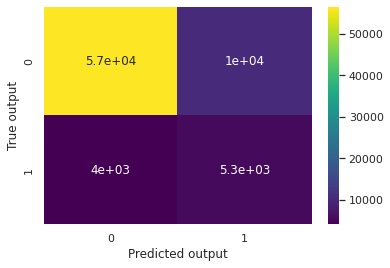

In [ ]:
cm = confusion_matrix(y_test, preds)
sns.heatmap(cm, robust=True,
            vmin=cm.min(), vmax=cm.max(), annot=True,
            cmap='viridis')
plt.xlabel('Predicted output')
plt.ylabel('True output')
plt.show()

## TRIAL

In [ ]:
rf1=RandomForestClassifier()

In [ ]:
rf1.fit(X_train_under_sample, y_train_under_sample)

RandomForestClassifier()

In [ ]:
pred = rf1.predict(X_test)

In [ ]:
f1_score(y_test, pred)

0.42682280493652686

In [ ]:
from lightgbm import LGBMClassifier
lgbcl = LGBMClassifier(boosting_type='gbdt',n_estimators=500,depth=10,learning_rate=0.04,objective='binary',metric='auc',
                 colsample_bytree=0.5,reg_lambda=2,reg_alpha=2,random_state=294,n_jobs=-1)

In [ ]:
lgbcl.fit(X_train_under_sample, y_train_under_sample)

LGBMClassifier(colsample_bytree=0.5, depth=10, learning_rate=0.04, metric='auc',
               n_estimators=500, objective='binary', random_state=294,
               reg_alpha=2, reg_lambda=2)

In [ ]:
pred = lgbcl.predict(X_test)
f1_score(y_test, pred)

0.42803756699611534